# Машинное обучение, ФКН ВШЭ
# Практическое задание 10. Обучение без учителя.

## Общая информация

Дата выдачи: 26.03.2025

Мягкий дедлайн: 13.04.2025 23:59 MSK

Жёсткий дедлайн: 17.04.2025 23:59 MSK

### Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

### Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

### О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.

In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

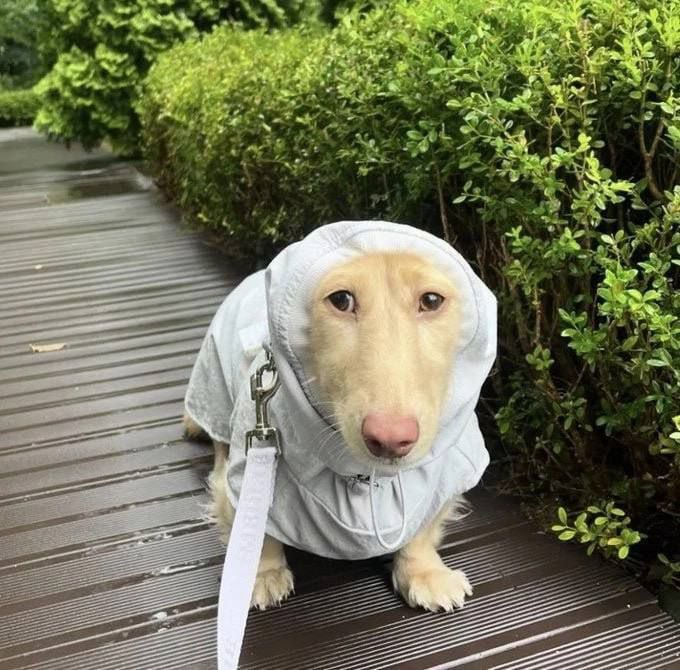

## Часть 1. Кластеризация автобусных остановок

### Задание 1.1 (1 балл)

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from numpy.linalg import eigh


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        # D = diag({d_i})
        # d_i = \sum_j w_ij = e_i^T W 1 -> d = {e_1^T W 1, ..., e_l^T W 1} = I W 1
        degrees = np.sum(X, axis=1)
        D = np.diag(degrees)

        # L = D - W
        L = D - X
        # make spectral decomposition and get (eigenvalues, eigenvectors)
        eigenvalues, eigenvectors = eigh(L) # sorted eigvals ang L is symmetric 
        # return first n_components eigenvectors with least eigenvalues != 0
        z = (eigenvalues == 0).sum()
        return eigenvectors[:, z:self.n_components+z]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [3]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Альтернативная ссылка: [отсюда](https://disk.yandex.ru/i/J0HlcDXd_KyIeg). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [4]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [5]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

### Задание 1.2 (1 балл)

Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [6]:
def distance2(stop1, stop2) -> float:
    x1 = stop1['Longitude_WGS84_en']
    y1 = stop1['Latitude_WGS84_en']

    x2 = stop2['Longitude_WGS84_en']
    y2 = stop2['Latitude_WGS84_en']

    return (x1-x2)**2 + (y1-y2)**2

def get_routes(data: pd.DataFrame) -> dict:
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes = {}
    all_routes = data['RouteNumbers_en']
    for i, e in enumerate(all_routes):
        rts = e.split('; ')
        for r in rts:
            routes[r] = routes.get(r, []) + [i]
    return routes


def sort_routes(data: pd.DataFrame, routes: dict):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    res = {}
    for route, ids in routes.items():
        stops = ids.copy()
        assert len(ids) != 0
        # choose fahrest point
        mx = 0
        start = stops[0]
        for i in stops:
            # sum of distances^2 to other points
            s = 0
            for j in stops:
                if i == j:
                    continue
                s += distance2(data.iloc[i], data.iloc[j]) ** (1/2)
            if s > mx:
                mx = s
                start = i
        # add closest until all routes added
        stops.remove(start)
        sorted_stops = [start]
        while len(stops) != 0:
            # find closest
            last = sorted_stops[-1]
            mn = 1e10
            closest = -1
            for i in stops:
                d = distance2(data.iloc[last], data.iloc[i])
                if d < mn:
                    mn = d
                    closest = i
            assert closest != -1
            sorted_stops.append(closest)
            stops.remove(closest)
        res[route] = sorted_stops
    return res



def get_adjacency_matrix(data: pd.DataFrame, sorted_routes: dict):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    n_samples = len(data)
    res = np.zeros([n_samples, n_samples])
    
    for route, ids in sorted_routes.items():
        for i in range(1, len(ids)):
            idx1, idx2 = ids[i], ids[i-1]
            res[idx1, idx2] += 1
            res[idx2, idx1] += 1
    return res

In [7]:
ids = get_routes(data)['АТ82']
data.iloc[ids]

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
731,9956,1001848,"«Тверская Застава», площадь Тверская Застава (...",37.584632,55.776472,площадь Тверская Застава,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,А27; А905; А101; АН1; А904; А904К; АМ1; А84; А...,Тверская Застава,NaN,да,ГУП «Мосгортранс»,active,889143224,NaN
732,9957,1001849,"«Тверская Застава», площадь Тверская Застава (...",37.584477,55.775993,площадь Тверская Застава,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,А27; А905; А904К; А84; АТ20; А456; АТ70; АТ82,Тверская Застава,NaN,да,ГУП «Мосгортранс»,active,889143225,NaN


In [8]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [9]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

### Задание 1.3 (0 баллов)

Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [10]:
from typing import List
from matplotlib import pyplot as plt
from matplotlib.colors import to_hex


def create_colormap(n, cmap_name='viridis'):
    cmap = plt.get_cmap(cmap_name)
    colors = [to_hex(cmap(i), keep_alpha=False) for i in np.linspace(0, 1, n)]
    return colors


def draw_clustered_map(data: pd.DataFrame, labels: List[int]) -> folium.Map:
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    assert len(labels) == len(data)
    res = folium.Map([55.75215, 37.61819], zoom_start=12)

    n_clusters = len(set(labels))
    colors = create_colormap(n_clusters)
    ulabels = set(labels)
    cmap = dict(zip(ulabels, colors))

    for id, row in data.iterrows():
        cluster_label = labels[id]
        c = cmap[cluster_label]
        folium.CircleMarker(
            location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
            radius=5,  # Размер кружка
            color=c,  # Цвет границы
            fill=True,
            fill_color=c,  # Цвет заливки
            fill_opacity=1,  # Прозрачность заливки
            popup=f"Cluster: {cluster_label}"  # Всплывающая подсказка
        ).add_to(res)

    return res

### Задание 1.4 (1.5 балла)

Примените алгоритмы кластеризации и подберите гиперпараметры так, чтобы кластеры получились осмысленными (нет такого, что все принадлежит одному кластеру или большая часть точек это шум):
- `sklearn.clustering.KMeans` - `n_clusters`
- `sklearn.clustering.DBSCAN` - `eps`
- ваш `SpectralClustering` - `n_clusters` и `n_components`

Для ряда алгоритмов, в частности DBSCAN, подобрать оптимальные параметры может быть ой, как непросто. Чтобы помочь сохранить нервные клетки рекомендуется пользоваться метриками Intrinsic Evaluation для кластеризации. Для каждого алгоритма скорее всего придется брать разные метрики, а может быть оптимизировать сразу несколько.

Ваша задача - выбрать подходящую метрику, можно взять что-то из списка ниже, можно спросить у гугла. Применить GridSearch, `optuna` или `hyperopt` и желательно завернуть отбор параметров в функцию, пригодится далее

1. $
   \text{Calinski-Harabasz Index} \in [0, \inf] = \frac{\sum_{i=1}^k BCSS_i/(k-1)}{\sum_{i=1}^k WCSS_i/(n-k)} = \frac{\sum_{i=1}^k n_i \| \mathbf{c}_i - \mathbf{c} \|^2/(k-1)}{\sum_{i=1}^k \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - \mathbf{c}_i\|^2/(n-k)} \rightarrow max
   $
   - Отношение 1) расстояния от центра кластера до центра всех данных к 2) расстоянию от центра кластера до точки
   - Чем однороднее и дальше друг от друга кластеры, тем лучше
2. $
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера
   - $b_i$ - среднее расстояние до точек из ближайшего кластера
   - Если в своем кластере точки близко - кластер плотный, идеальный вариант, скор равен 1, если свой кластер совпадает с соседним - кластеры неразделимы, скор равен нулю
   - Чем однороднее и разделимее кластеры, тем лучше
3. $\text{Davies-Bouldin Index} \in [0, inf] = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \left( \frac{WCSS_i + WCSS_j}{d(c_i, c_j)} \right) \rightarrow min $
   - Отношение внутрикластерных расстояний к межкластерному расстоянию между двумя центрами
   - Если кластеры далеко друг от друга, но при этом однородные, скор наименьший
4. $\text{Elbow Method}$ - последовательное сравнение $WCSS$ из пункта 1 для разного числа параметров. Если уменьшение меньше определенного порога - останавливаемся, считаем это значение оптимальным

In [11]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.model_selection import ParameterGrid

def optimize_clustering(X, algorithm, param_grid, metric):
    best_score = -np.inf if metric == 'silhouette' else np.inf
    best_params = {}
    grid = ParameterGrid(param_grid)
    best_labels = None
    scores = []
    
    for params in grid:
        labels = algorithm(**params).fit_predict(X)
        score = 0
        if metric == 'silhouette':
            score = silhouette_score(X, labels)
            if score > best_score:
                best_score, best_params, best_labels = score, params, labels
        elif metric == 'davies_bouldin':
            score = davies_bouldin_score(X, labels)
            if score < best_score:
                best_score, best_params, best_labels = score, params, labels
        scores.append(score)
    return best_params, scores, best_labels

In [12]:
A = get_adjacency_matrix(data, sorted_routes)
A.shape

(1037, 1037)

In [13]:
C = data.loc[:, ['Latitude_WGS84_en', 'Longitude_WGS84_en']].values
C.shape

(1037, 2)

#### K-means

In [14]:
# routes = get_routes(data)
# sorted_routes = sort_routes(data, routes)
# adjacency_matrix = get_adjacency_matrix(data, sorted_routes)
n_clusters = [9, 16, 25, 36]
param_grid = {'n_clusters': n_clusters}
best_params, scores, labels_kmeans = optimize_clustering(C, KMeans, param_grid, 'silhouette')

In [15]:
print(best_params)
for i in range(len(scores)):
    print(f'{scores[i]: 0.2f}\t{n_clusters[i]}')

{'n_clusters': 9}
 0.41	9
 0.38	16
 0.40	25
 0.40	36


#### DBSCAN

Определим порядок около которого будем подбирать `eps`

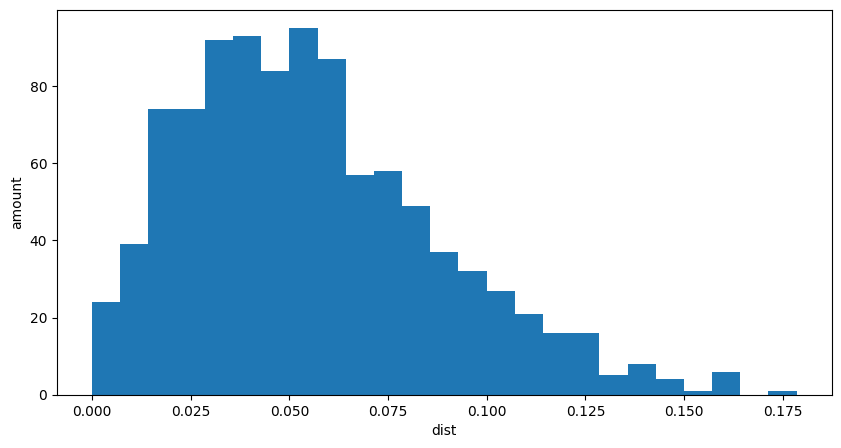

In [16]:
import random
def random_dist(C):
    i = random.randint(0, len(C) - 1)
    j = random.randint(0, len(C) - 1)
    dist = ((C[i] - C[j])**2).sum()**(1/2)
    return dist
dists = [random_dist(C) for _ in range(1000)]
plt.figure(figsize=(10, 5))
plt.hist(dists, bins=25)
plt.xlabel('dist')
plt.ylabel('amount')
plt.show()

In [17]:
from sklearn.cluster import DBSCAN

param_grid = {'eps': [0.0005, 0.001, 0.0025], 'min_samples': [1, 2, 3]}
best_params, scores, labels_db = optimize_clustering(C, DBSCAN, param_grid, 'davies_bouldin')
db = DBSCAN(**best_params).fit(C)
print(best_params)
labels_db = db.labels_

{'eps': 0.0005, 'min_samples': 1}


In [18]:
for i, score in enumerate(scores):
    print(f'{score: 0.2f}', end=' ')
    if i % 3 == 2:
        print()

 0.08  1.28  1.14 
 0.20  1.29  1.48 
 0.55  1.53  1.55 


#### SpectralClustering

In [19]:
n_clusters = [9, 16, 25, 36]
param_grid = {'n_clusters': n_clusters}
best_params, scores, labels_spectral = optimize_clustering(A, GraphClustering, param_grid, 'silhouette')

#### Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`.

In [20]:
draw_clustered_map(data, labels_kmeans)

In [21]:
draw_clustered_map(data, labels_db)


In [22]:
draw_clustered_map(data, labels_spectral)

**Вопрос:** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** Определенно спектральная кластеризация показывает себя наилучшим образом из-за того, что она учитывает структуру маршрутов между остановками, а не их расположение. Это хорошо видно по получившимся кластерам, в которых например через пол садового кольца тянется один кластер, несмотря на то, что это очень далекие по расстоянию точки. 

## Часть 2. Тематическое моделирование текстов

### Подготовка

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [23]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
2083,tech,260.txt,Apple unveils low-cost 'Mac mini',"Apple has unveiled a new, low-cost Macintosh ..."
1722,sport,410.txt,Taylor poised for Scotland return,Simon Taylor has been named in the Scotland s...
985,politics,090.txt,MSPs hear renewed climate warning,Climate change could be completely out of con...
390,business,391.txt,Yukos heading back to US courts,Russian oil and gas company Yukos is due in a...
746,entertainment,237.txt,Singer Knight backs anti-gun song,R&B star Beverley Knight said she sang on an ...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [24]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [25]:
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt_tab to
[nltk_data]     /home/sacr1ficerq/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/sacr1ficerq/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/sacr1ficerq/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [26]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [27]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [28]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

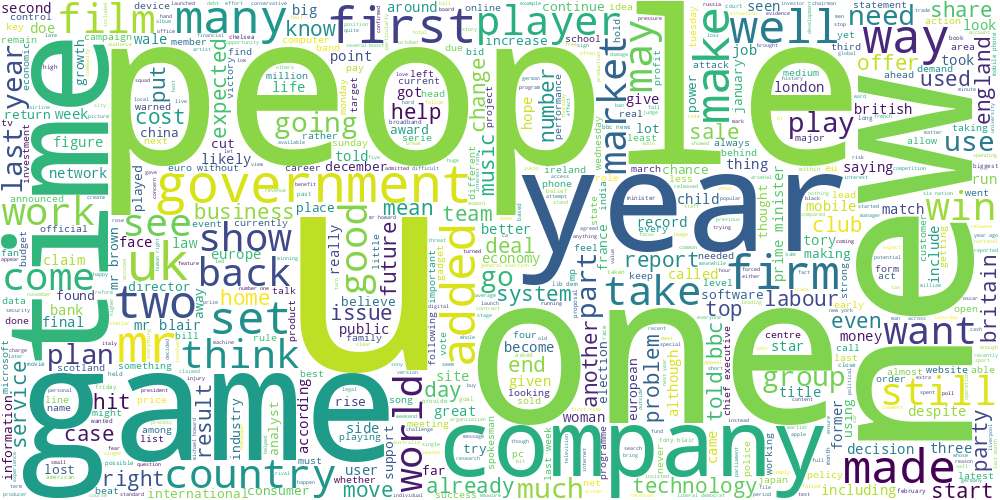

In [29]:
draw_wordcloud(data.text)

### Задание 2.1 (1 балл)

Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров.

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer as Vectorizer_tf_idf

corpus = data['text'].values

vectorizer = Vectorizer_tf_idf()

X = vectorizer.fit_transform(corpus)

print("terms:", vectorizer.get_feature_names_out())
print("TF-IDF sparse matrix:\n", X.toarray())

terms: ['aa' 'aaa' 'aac' ... 'zutons' 'zvonareva' 'zvyagintsev']
TF-IDF sparse matrix:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [31]:
X.shape

(2225, 24218)

In [32]:
clusterizer_kmeans = KMeans(n_clusters=8)

In [33]:
labels_kmeans = clusterizer_kmeans.fit_predict(X)

In [34]:
data['labels_kmeans'] = labels_kmeans

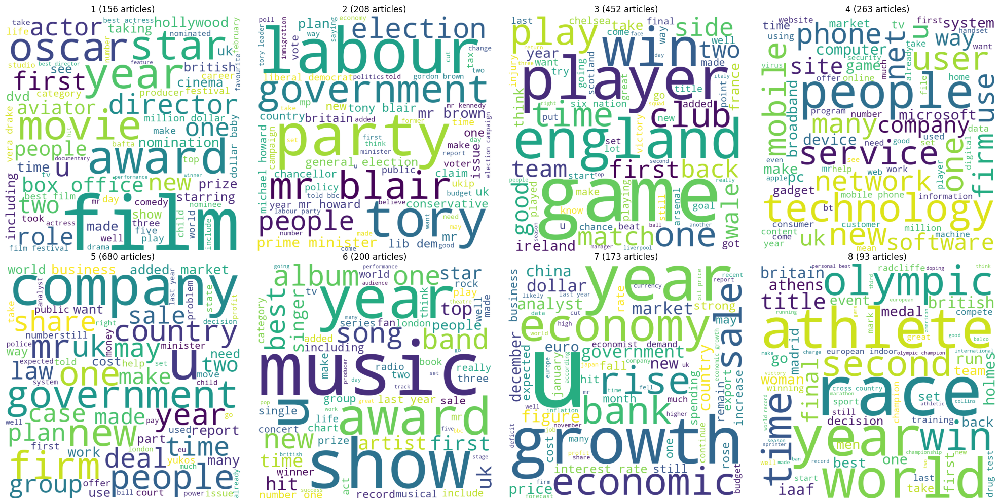

In [35]:
# draw_wordcloud(data.loc[data['label'] == 0].text, max_words=100, width=500, height=200)
def get_cluster(i, label='label'):
    return data.loc[data[label] == i].text

def word_could(words):
    return draw_wordcloud(words, max_words=72, width=800, height=800)
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for c in range(8):
    cluster = get_cluster(c, 'labels_kmeans')
    i = c // 4
    j = c % 4
    ax[i, j].axis(False)
    ax[i, j].set_title(f'{c+1} ({len(cluster)} articles)')
    ax[i, j].imshow(word_could(cluster))

plt.tight_layout()
plt.show()

Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** Да, очень интерпретируемы:
1. Поп-культура и Голивуд
2. Политика
3. Футбол?
4. Технологии
5. Бизнес
6. Поп-культура и музыка
7. Экономика
8. Спорт

### Задание 2.2 (0.5 балла)

Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.

In [36]:
(clusterizer_kmeans.cluster_centers_[7] > 0.035).sum()

21

In [37]:
center_words_kmeans = vectorizer.inverse_transform(clusterizer_kmeans.cluster_centers_ > 0.03)
[print(i+1, *words, '\n') for i, words in enumerate(center_words_kmeans)]

1 actor actress aviator award best director festival film movie oscar star 

2 blair brown campaign chancellor conservative election government howard kennedy labour leader lib minister mr party people plan prime tax tory would 

3 england game player 

4 broadband device digital microsoft mobile music net people phone service site software technology user 

5 mr 

6 album award band best chart music show song 

7 bank china deficit dollar economic economist economy euro export figure growth market month oil price quarter rate rise sale spending year 

8 athens athlete athletics champion championship drug european gold greek holmes iaaf indoor kenteris marathon medal olympic olympics race radcliffe sprinter test thanou world 



[None, None, None, None, None, None, None, None]

Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Да, очень согласуются. По сути это и есть самые большие слова в облаках почти во всех случаях.

### Задание 2.3 (1.5 балла)

В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров (подумайте, как это можно сделать)

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [38]:
from sklearn.cluster import SpectralClustering

In [39]:
clusterizer_spectral = SpectralClustering(n_clusters=8)
labels_spectral = clusterizer_spectral.fit_predict(X)
data['labels_spectral'] = labels_spectral

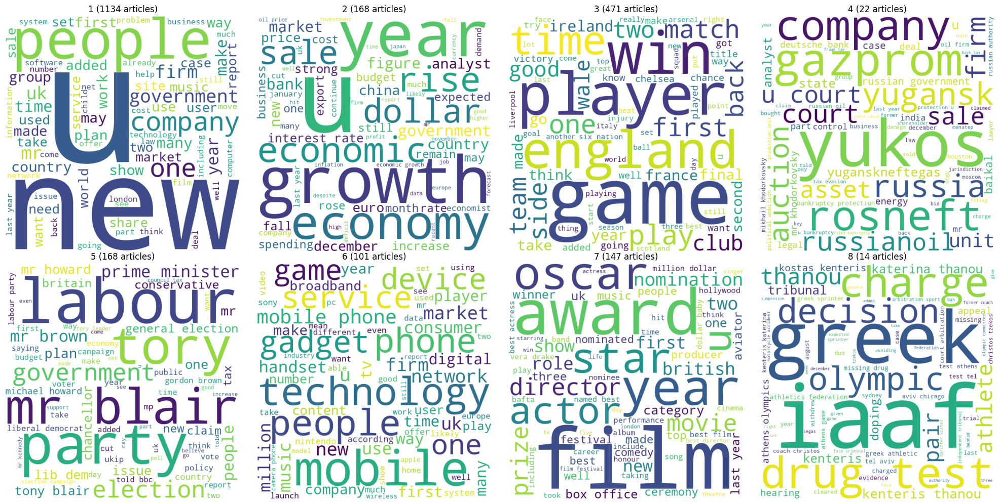

In [40]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))

for c in range(8):
    cluster = get_cluster(c, 'labels_spectral')
    i = c // 4
    j = c % 4
    ax[i, j].axis(False)
    ax[i, j].set_title(f'{c+1} ({len(cluster)} articles)')
    ax[i, j].imshow(word_could(cluster))

plt.tight_layout()
plt.show()

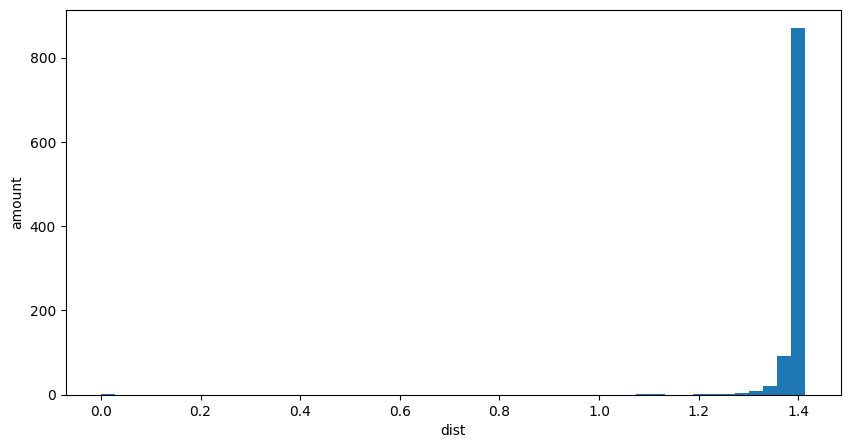

In [41]:
import random
def random_dist(C):
    i = random.randint(0, len(C) - 1)
    j = random.randint(0, len(C) - 1)
    dist = ((C[i] - C[j])**2).sum()**(1/2)
    return dist

C = X.toarray()
dists = [random_dist(C) for _ in range(1000)]
plt.figure(figsize=(10, 5))
plt.hist(dists, bins=50)
plt.xlabel('dist')
plt.ylabel('amount')
plt.show()

In [42]:
from tqdm import tqdm
from collections import Counter

def optimize_clustering(X, algorithm, param_grid):
    best_score = np.inf
    best_params = {}
    grid = ParameterGrid(param_grid)
    best_labels = None
    scores = []
    print(f"{'eps':>8} {'min_samples':>8}")
    for params in grid:
        labels = algorithm(**params).fit_predict(X)
        score = abs(len(set(labels)) - 9) # 8 clusters and one for outliers
        print(params)
        print('clusters_n:', len(set(labels)))
        print(f"{params['eps']:>8}{params['min_samples']:>8}")
        if score < best_score:
            best_score, best_params, best_labels = score, params, labels
        scores.append(score)
    return best_params, scores, best_labels


param_grid = {'eps': [1.3, 1.32, 1.35], 'min_samples': [35, 40, 50, 60]}
best_params, scores, best_labels = optimize_clustering(C, DBSCAN, param_grid)
print(Counter(best_labels))

     eps min_samples
{'eps': 1.3, 'min_samples': 35}
clusters_n: 5
     1.3      35
{'eps': 1.3, 'min_samples': 40}
clusters_n: 4
     1.3      40
{'eps': 1.3, 'min_samples': 50}
clusters_n: 6
     1.3      50
{'eps': 1.3, 'min_samples': 60}
clusters_n: 5
     1.3      60
{'eps': 1.32, 'min_samples': 35}
clusters_n: 2
    1.32      35
{'eps': 1.32, 'min_samples': 40}
clusters_n: 2
    1.32      40
{'eps': 1.32, 'min_samples': 50}
clusters_n: 2
    1.32      50
{'eps': 1.32, 'min_samples': 60}
clusters_n: 2
    1.32      60
{'eps': 1.35, 'min_samples': 35}
clusters_n: 2
    1.35      35
{'eps': 1.35, 'min_samples': 40}
clusters_n: 2
    1.35      40
{'eps': 1.35, 'min_samples': 50}
clusters_n: 2
    1.35      50
{'eps': 1.35, 'min_samples': 60}
clusters_n: 2
    1.35      60
Counter({-1: 1072, 0: 515, 1: 423, 3: 116, 4: 51, 2: 48})


In [43]:
param_grid

{'eps': [1.3, 1.32, 1.35], 'min_samples': [35, 40, 50, 60]}

In [44]:
scores

[4, 5, 3, 4, 7, 7, 7, 7, 7, 7, 7, 7]

In [45]:
clusterizer_db = DBSCAN(**best_params)
labels_db = clusterizer_db.fit_predict(X)
data['labels_db'] = labels_db
len(set(labels_db))

6

In [46]:
for i, score in enumerate(scores):
    print(f'{score: 0.2f}', end=' ')
    if i % 4 == 3:
        print()

 4.00  5.00  3.00  4.00 
 7.00  7.00  7.00  7.00 
 7.00  7.00  7.00  7.00 


0 515
1 423
2 48
3 116
4 51
5 0
6 0
7 0


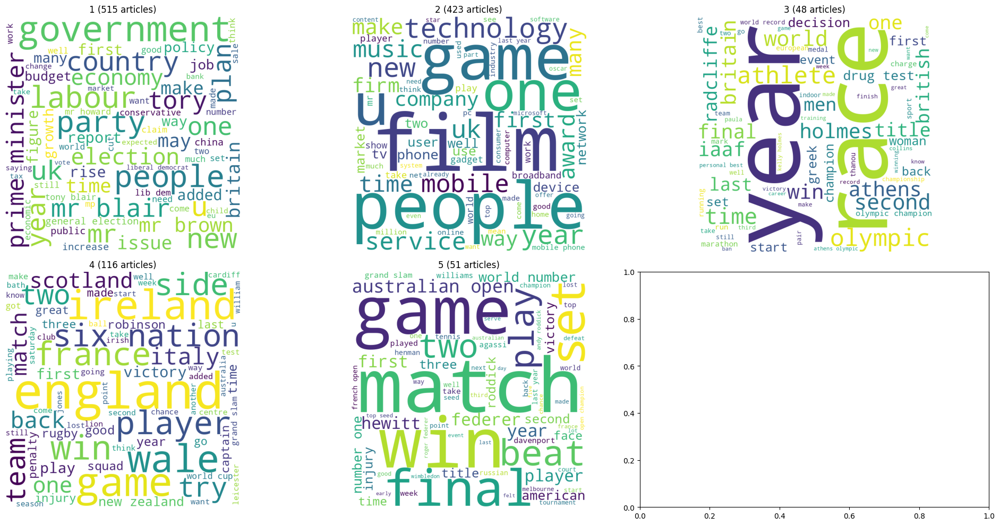

In [47]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
for c in range(8):
    cluster = get_cluster(c, 'labels_db')


    print(c, len(cluster))
    if len(cluster) == 0:
        continue
    i = c // 3
    j = c % 3
    ax[i, j].axis(False)
    ax[i, j].set_title(f'{c+1} ({len(cluster)} articles)')
    ax[i, j].imshow(word_could(cluster))

plt.tight_layout()
plt.show()

In [48]:
set(labels_db)

{-1, 0, 1, 2, 3, 4}

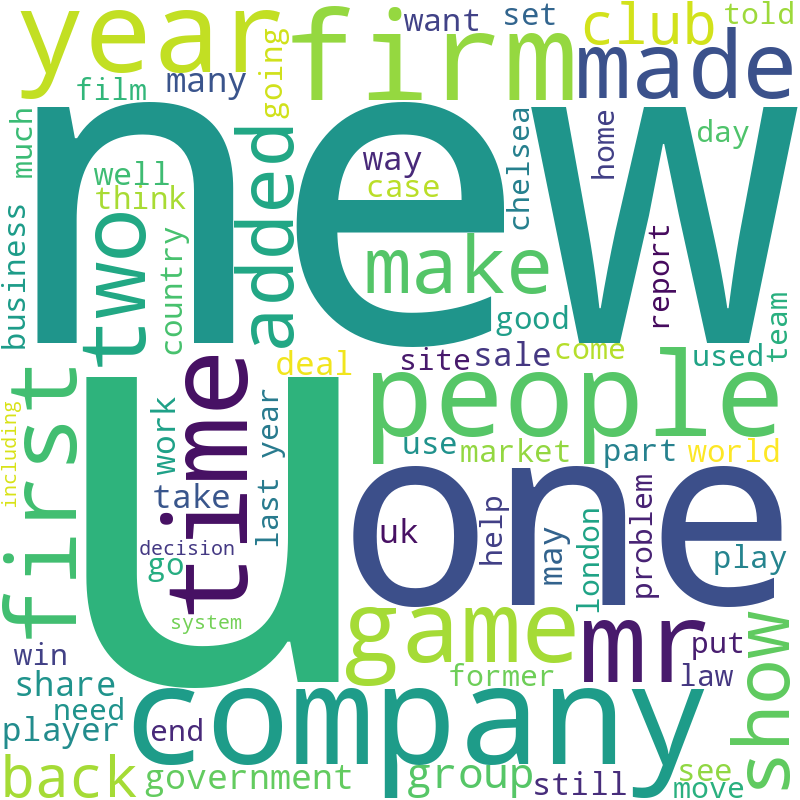

In [49]:
txt = data.loc[data.labels_db == -1].text
word_could(txt)

In [50]:
from collections import Counter
print(Counter(data.labels_db))
print(Counter(data.labels_kmeans))
print(Counter(data.labels_spectral))

Counter({-1: 1072, 0: 515, 1: 423, 3: 116, 4: 51, 2: 48})
Counter({4: 680, 2: 452, 3: 263, 1: 208, 5: 200, 6: 173, 0: 156, 7: 93})
Counter({0: 1134, 2: 471, 1: 168, 4: 168, 6: 147, 5: 101, 3: 22, 7: 14})


Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** у `DBSCAN` я не смог снизить количество выбросов менее 1000, чтобы осталось около 8 кластеров. При повышении `eps` у меня все съедал один кластер из-за того, как близко к одной дистанции расположенны статьи. Самая сбаллансированная кластеризация получилась у `k-means`. Тяжело что-то сказать про изоморфизм с географическими данными, но определенно я также как и там выбрал бы спектральную кластеризацию, потому что она выделила смешной кластер посвященный России. 

### Задание 2.4 (1.5 балла)

Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means.

In [51]:
from sklearn.feature_extraction.text import CountVectorizer

tokenized_corpus = [doc.split() for doc in corpus]

vectorizer_bow = CountVectorizer()
X_bow = vectorizer_bow.fit_transform(corpus)

print("terms:", vectorizer_bow.get_feature_names_out())
print("TF-IDF sparse matrix:\n", X_bow.toarray())

from gensim.matutils import Sparse2Corpus
gensim_corpus = Sparse2Corpus(X_bow, documents_columns=True)

terms: ['aa' 'aaa' 'aac' ... 'zutons' 'zvonareva' 'zvyagintsev']
TF-IDF sparse matrix:
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [52]:
from gensim.models import LdaModel
from gensim.corpora import Dictionary

dictionary = Dictionary(tokenized_corpus)

num_topics = 8 * 3
lda_model = LdaModel(
    corpus=gensim_corpus,
    id2word=dictionary,
    num_topics=num_topics,
    passes=10,
    alpha='auto',
    eta='auto'
)

print(lda_model.print_topics())

[(7, '0.067*"felt" + 0.067*"labour" + 0.060*"mecca" + 0.050*"imbalance" + 0.039*"grow" + 0.033*"successful" + 0.027*"water" + 0.027*"hood" + 0.027*"fluid" + 0.025*"brunt"'), (17, '0.060*"best" + 0.044*"come" + 0.032*"colour" + 0.030*"active" + 0.030*"mining" + 0.029*"lorillard" + 0.029*"took" + 0.025*"afternoon" + 0.024*"poorer" + 0.024*"uk"'), (4, '0.038*"sent" + 0.038*"flat" + 0.035*"powell" + 0.035*"blamed" + 0.034*"trading" + 0.032*"supportive" + 0.028*"fight" + 0.027*"thank" + 0.026*"approved" + 0.026*"job"'), (6, '0.069*"six" + 0.052*"noise" + 0.048*"unlikely" + 0.031*"open" + 0.028*"hotel" + 0.026*"probably" + 0.026*"faced" + 0.026*"gartner" + 0.024*"producer" + 0.024*"gerhard"'), (0, '0.054*"modest" + 0.030*"pushed" + 0.028*"name" + 0.028*"lashed" + 0.028*"henri" + 0.027*"enterprise" + 0.026*"rum" + 0.025*"vast" + 0.023*"along" + 0.021*"deepening"'), (18, '0.048*"sue" + 0.047*"deutsche" + 0.039*"represented" + 0.039*"mitsui" + 0.037*"governance" + 0.036*"cotis" + 0.031*"revise"

In [53]:
for idx, topic in lda_model.show_topics(8*3):
    print(idx)
    print(topic)

0
0.054*"modest" + 0.030*"pushed" + 0.028*"name" + 0.028*"lashed" + 0.028*"henri" + 0.027*"enterprise" + 0.026*"rum" + 0.025*"vast" + 0.023*"along" + 0.021*"deepening"
1
0.029*"transport" + 0.029*"news" + 0.021*"capitalisation" + 0.021*"hit" + 0.021*"falling" + 0.019*"continues" + 0.018*"consolidation" + 0.016*"dip" + 0.016*"publisher" + 0.016*"one"
2
0.058*"headquarters" + 0.036*"worst" + 0.035*"agroflora" + 0.032*"document" + 0.029*"advanced" + 0.029*"boundary" + 0.028*"daiwa" + 0.027*"stockpile" + 0.027*"recalling" + 0.026*"cheaper"
3
0.126*"crop" + 0.046*"distribution" + 0.020*"fao" + 0.019*"mayland" + 0.018*"early" + 0.016*"research" + 0.016*"ended" + 0.016*"issue" + 0.014*"developing" + 0.012*"employment"
4
0.038*"sent" + 0.038*"flat" + 0.035*"powell" + 0.035*"blamed" + 0.034*"trading" + 0.032*"supportive" + 0.028*"fight" + 0.027*"thank" + 0.026*"approved" + 0.026*"job"
5
0.035*"hole" + 0.033*"cash" + 0.031*"smoking" + 0.029*"sued" + 0.027*"egypt" + 0.026*"continued" + 0.022*"el"

Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** Да, темы явно более узкие. И это ожидаемо, так как мы ввели в три раза больше тем. Вот самые инерпретируемые:
- 0: Торговля нефтью
- 22: Сельское хозяйство
- 15: Финансовый крах

In [54]:
topics = lda_model.show_topics(num_topics=24, num_words=72, formatted=False)
all_topics_words = {}
for topic in topics:
    for word, weight in topic[1]:
        all_topics_words[word] = all_topics_words.get(word, 0) + weight

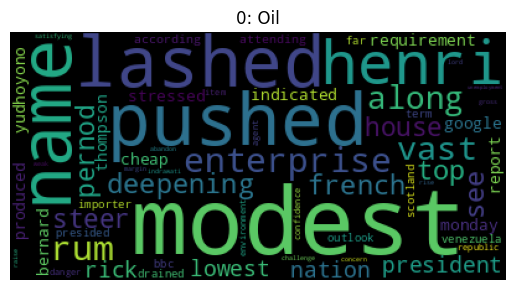

In [55]:
topic_id = 0
topic_words = dict(topics[topic_id][1])

wordcloud = WordCloud().generate_from_frequencies(topic_words)

plt.title(f'{topic_id}: Oil')
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

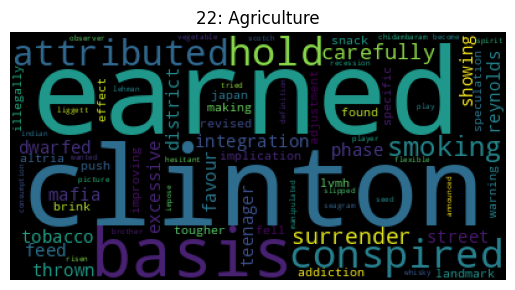

In [56]:
topic_id = 22
topic_words = dict(topics[topic_id][1])

wordcloud = WordCloud().generate_from_frequencies(topic_words)

plt.title(f'{topic_id}: Agriculture')
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

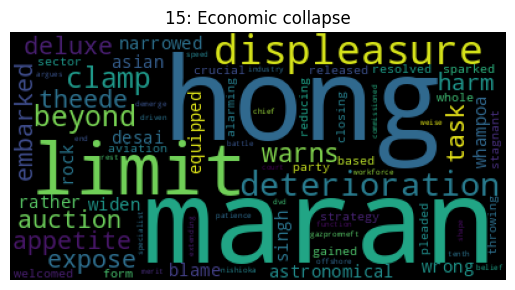

In [57]:
topic_id = 15
topic_words = dict(topics[topic_id][1])

wordcloud = WordCloud().generate_from_frequencies(topic_words)

plt.title(f'{topic_id}: Economic collapse')
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## Часть 3. Transfer learning и Self-Supervised Learning для задачи классификации текстов

### Задание 3.1 (0.5 балла)

Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
from sklearn.feature_extraction.text import TfidfVectorizer as Vectorizer_tf_idf

corpus = data['text'].values
y = data['category']

In [60]:
categories = set(data['category'].values)
categories2id = dict(zip(categories, range(len(categories))))
id2categories = dict(zip(range(len(categories)), categories))
id2categories

{0: 'sport', 1: 'entertainment', 2: 'business', 3: 'politics', 4: 'tech'}

In [61]:
y = [categories2id.get(x) for x in  y]

In [62]:
y = np.array(y)
y

array([2, 2, 2, ..., 4, 4, 4])

In [63]:
corpus_train, corpus_test,y_train, y_test = train_test_split(corpus, y, test_size=0.3, random_state=42)

In [64]:
vectorizer_idf = Vectorizer_tf_idf()

vectorizer_idf.fit(corpus_train)

TfidfVectorizer()

In [65]:
X_train = vectorizer_idf.transform(corpus_train)
X_test = vectorizer_idf.transform(corpus_test)

print("terms:", vectorizer_idf.get_feature_names_out())
print("TF-IDF sparse matrix:\n", X_test.toarray())

terms: ['aa' 'aaa' 'aac' ... 'zurich' 'zutons' 'zvonareva']
TF-IDF sparse matrix:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


#### Logistic Regression

In [66]:
from sklearn.linear_model import LogisticRegression
model_lr = LogisticRegression()

In [67]:
model_lr.fit(X_train, y_train)

LogisticRegression()

#### K-means + LogReg

In [68]:
clusterizer_kmeans = KMeans()
X_train_transformed_kmeans = clusterizer_kmeans.fit_transform(X_train)
X_test_transformed_kmeans = clusterizer_kmeans.transform(X_test)
model_lr_kmeans = LogisticRegression()
model_lr_kmeans.fit(X_train_transformed_kmeans, y_train)

LogisticRegression()

#### LDA + LogReg

In [69]:
from sklearn.decomposition import LatentDirichletAllocation

vectorizer_bow = CountVectorizer()
X_train_bow = vectorizer_bow.fit_transform(corpus_train)
X_test_bow = vectorizer_bow.transform(corpus_test)

clusterizer_lda = LatentDirichletAllocation()
X_train_transformed_lda = clusterizer_lda.fit_transform(X_train_bow)
X_test_transformed_lda = clusterizer_lda.transform(X_test_bow)

model_lr_lda = LogisticRegression()
model_lr_lda.fit(X_train_transformed_lda, y_train)

LogisticRegression()

#### Результаты

In [70]:
from sklearn.metrics import accuracy_score

def get_results(model, X_train, y_train, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f'Test accuracy:\t{accuracy_score(y_test, y_pred)}')
    y_pred = model.predict(X_train)
    print(f'Train accuracy:\t{accuracy_score(y_train, y_pred)}')

In [71]:
print('Logistic Regression:')
get_results(model_lr, X_train, y_train, X_test, y_test)

Logistic Regression:
Test accuracy:	0.9730538922155688
Train accuracy:	0.9974309569685292


In [72]:
print('Logistic Regression + K-means:')
get_results(model_lr_kmeans, X_train_transformed_kmeans, y_train, X_test_transformed_kmeans, y_test)

Logistic Regression + K-means:
Test accuracy:	0.8053892215568862
Train accuracy:	0.8015414258188824


In [73]:
print('Logistic Regression + LDA:')
get_results(model_lr_lda, X_train_transformed_lda, y_train, X_test_transformed_lda, y_test)

Logistic Regression + LDA:
Test accuracy:	0.9086826347305389
Train accuracy:	0.8542068079640334


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Эхъ, кластеризировали, кластеризировали и все зря получается. В итоге обычная логистическая регрессия лучше всех все сделала.

### Задание 3.2 (1.5 балла)

Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [74]:
corpus_new, corpus_val, y_new, y_val = train_test_split(corpus, y, test_size=0.3, random_state=42)

In [75]:
vectorizer_idf = Vectorizer_tf_idf()
vectorizer_idf.fit(corpus_train)

X_new = vectorizer_idf.transform(corpus_new)
X_val = vectorizer_idf.transform(corpus_val)

print("terms:", vectorizer_idf.get_feature_names_out())
print("TF-IDF sparse matrix:\n", X_test.toarray())

terms: ['aa' 'aaa' 'aac' ... 'zurich' 'zutons' 'zvonareva']
TF-IDF sparse matrix:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [76]:
corpus_train_good, corpus_train_bad, y_train_good, y_train_bad = train_test_split(corpus_new, y_new, test_size=65/70)

In [77]:
X_train_good = vectorizer_idf.transform(corpus_train_good)
X_train_bad = vectorizer_idf.transform(corpus_train_bad)

#### No clusterization

In [78]:
from sklearn.linear_model import LogisticRegression
model_lr = LogisticRegression()

model_lr.fit(X_train_good, y_train_good)

LogisticRegression()

#### K-means

In [79]:
def optimize_clustering(X_train, X_train_good, X_val, y_train_good, y_val, algorithm, clusterizer_algorithm, param_grid):
    best_accuracy = 0
    best_params = {}
    grid = ParameterGrid(param_grid)
    scores = []

    for params in grid:
        clusterizer = clusterizer_algorithm(**params).fit(X_train)
        X_train_good_transformed = clusterizer.transform(X_train_good)
        model = algorithm().fit(X_train_good_transformed, y_train_good)
        X_val_transformed = clusterizer.transform(X_val)
        y_pred = model.predict(X_val_transformed)
        accuracy = accuracy_score(y_val, y_pred)
        if accuracy > best_accuracy:
            best_accuracy, best_params = accuracy, params
        scores.append(accuracy)
    return best_params, scores

In [80]:
param_grid_kmeans = {
    'n_clusters': [30, 50, 100, 120, 150],
}
best_params_kmeans, scores = optimize_clustering(X_train, X_train_good, X_val, y_train_good, y_val, LogisticRegression, KMeans, param_grid_kmeans)

/home/sacr1ficerq/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/sacr1ficerq/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logisti

In [90]:
best_params_kmeans

{'n_clusters': 150}

In [101]:
clusterizer_kmeans = KMeans(**best_params_kmeans)

clusterizer_kmeans.fit_transform(X_train)
X_train_good_transformed_kmeans = clusterizer_kmeans.transform(X_train_good)
X_test_transformed_kmeans = clusterizer_kmeans.transform(X_test)
X_val_transformed_kmeans = clusterizer_kmeans.transform(X_val)

model_lr_kmeans = LogisticRegression()
model_lr_kmeans.fit(X_train_good_transformed_kmeans, y_train_good)

/home/sacr1ficerq/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

#### LDA

In [93]:
from sklearn.decomposition import LatentDirichletAllocation

vectorizer_bow = CountVectorizer()
X_train_bow = vectorizer_bow.fit_transform(corpus_train)

X_train_good_bow = vectorizer_bow.transform(corpus_train_good)
X_val_bow = vectorizer_bow.transform(corpus_val)

In [84]:
param_grid_lda = {
    'n_components': [30, 50, 100]
}
best_params_lda, scores = optimize_clustering(X_train_bow, X_train_good_bow, X_val_bow, y_train_good, y_val, LogisticRegression, LatentDirichletAllocation, param_grid_lda)


In [94]:
best_params_lda

{'n_components': 50}

In [86]:
X_train_good_transformed_lda = clusterizer_lda.fit_transform(X_train_good_bow)

model_lr_lda = LogisticRegression()
model_lr_lda.fit(X_train_transformed_lda, y_train)

LogisticRegression()

In [100]:
clusterizer_lda = LatentDirichletAllocation(**best_params_lda)

clusterizer_lda.fit(X_train_bow)

X_train_good_transformed_lda = clusterizer_lda.transform(X_train_good_bow)
X_test_transformed_lda = clusterizer_lda.transform(X_test_bow)
X_val_transformed_lda = clusterizer_lda.transform(X_val_bow)

model_lr_lda = LogisticRegression()
model_lr_lda.fit(X_train_good_transformed_lda, y_train_good)

LogisticRegression()

#### Результаты

In [97]:
print('Logistic Regression:')
get_results(model_lr, X_train_good, y_train_good, X_test, y_test)

Logistic Regression:
Test accuracy:	0.7934131736526946
Train accuracy:	1.0


In [102]:
print('Logistic Regression + K-means:')
get_results(model_lr_kmeans, X_train_good_transformed_kmeans, y_train_good, X_test_transformed_kmeans, y_test)

Logistic Regression + K-means:
Test accuracy:	0.7679640718562875
Train accuracy:	0.8918918918918919


In [104]:
print('Logistic Regression + LDA:')
get_results(model_lr_lda, X_train_good_transformed_lda, y_train_good, X_test_transformed_lda, y_test)

Logistic Regression + LDA:
Test accuracy:	0.8907185628742516
Train accuracy:	0.963963963963964


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Либо я ошибся, либо количество кластеров так сильно влияет на перфоманс модели. Но результаты получились потрясающие. Мы добились разительного уменьшения выборки, нельзя сказать, что в 20 раз, так как веторные представления теперь вместо разреженной матрицы представленны плотными веторами по 150 и 50 координат, но результат очень неожиданный и интересный - LDA дает +0.1 к accuracy, что очень значительно. Модель по прежнему переобучается, но хотя бы не запоминает выборку.



P.S. До этого HW я не понимал, зачем нам вообще нужна кластеризация, но после получения этих результатов, я надеюсь применить ее в своей работе по покеру с тонной неразмеченных шоудаунов :)